In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import datetime
from datetime import date, timedelta
import datetimec
import matplotlib.dates as mdates
%matplotlib inline
import pickle

In [2]:
df_covid_hospital = pd.read_csv('https://healthdata.gov/api/views/anag-cw7u/rows.csv?accessType=DOWNLOAD', parse_dates = ['collection_week'])

/var/tmp/ldh/pyenv/lib64/python3.7/site-packages/IPython/core/interactiveshell.py:3553: DtypeWarning: Columns (0,3) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [3]:
df_covid_hospital.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 717200 entries, 0 to 717199
Columns: 128 entries, hospital_pk to total_staffed_pediatric_icu_beds_7_day_sum
dtypes: bool(2), datetime64[ns](1), float64(87), int64(29), object(9)
memory usage: 690.8+ MB


https://healthdata.gov/Hospital/COVID-19-Reported-Patient-Impact-and-Hospital-Capa/anag-cw7u

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [5]:
df_covid_hospital.max()

/var/tmp/ldh/pyenv/lib64/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


collection_week                                                                                                     2023-01-06 00:00:00
state                                                                                                                                WY
hospital_name                                                                         ZUCKERBERG SAN FRANCISCO GENERAL HOSP & TRAUMA...
zip                                                                                                                             99901.0
hospital_subtype                                                                                                             Short Term
fips_code                                                                                                                       78020.0
is_metro_micro                                                                                                                     True
total_beds_7_day_avg                            

In [6]:
df_covid_hospital.tail(10)

,hospital_pk,collection_week,state,ccn,hospital_name,address,city,zip,hospital_subtype,fips_code,is_metro_micro,total_beds_7_day_avg,all_adult_hospital_beds_7_day_avg,all_adult_hospital_inpatient_beds_7_day_avg,inpatient_beds_used_7_day_avg,all_adult_hospital_inpatient_bed_occupied_7_day_avg,inpatient_beds_used_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg,inpatient_beds_7_day_avg,total_icu_beds_7_day_avg,total_staffed_adult_icu_beds_7_day_avg,icu_beds_used_7_day_avg,staffed_adult_icu_bed_occupancy_7_day_avg,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_avg,staffed_icu_adult_patients_confirmed_covid_7_day_avg,total_patients_hospitalized_confirmed_influenza_7_day_avg,icu_patients_confirmed_influenza_7_day_avg,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_avg,total_beds_7_day_sum,all_adult_hospital_beds_7_day_sum,all_adult_hospital_inpatient_beds_7_day_sum,inpatient_beds_used_7_day_sum,all_adult_hospital_inpatient_bed_occupied_7_day_sum,inpatient_beds_used_covid_7_day_sum,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_adult_patients_hospitalized_confirmed_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_covid_7_day_sum,inpatient_beds_7_day_sum,total_icu_beds_7_day_sum,total_staffed_adult_icu_beds_7_day_sum,icu_beds_used_7_day_sum,staffed_adult_icu_bed_occupancy_7_day_sum,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum,staffed_icu_adult_patients_confirmed_covid_7_day_sum,total_patients_hospitalized_confirmed_influenza_7_day_sum,icu_patients_confirmed_influenza_7_day_sum,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_sum,total_beds_7_day_coverage,all_adult_hospital_beds_7_day_coverage,all_adult_hospital_inpatient_beds_7_day_coverage,inpatient_beds_used_7_day_coverage,all_adult_hospital_inpatient_bed_occupied_7_day_coverage,inpatient_beds_used_covid_7_day_coverage,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_adult_patients_hospitalized_confirmed_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_covid_7_day_coverage,inpatient_beds_7_day_coverage,total_icu_beds_7_day_coverage,total_staffed_adult_icu_beds_7_day_coverage,icu_beds_used_7_day_coverage,staffed_adult_icu_bed_occupancy_7_day_coverage,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_coverage,staffed_icu_adult_patients_confirmed_covid_7_day_coverage,total_patients_hospitalized_confirmed_influenza_7_day_coverage,icu_patients_confirmed_influenza_7_day_coverage,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_coverage,previous_day_admission_adult_covid_confirmed_7_day_sum,previous_day_admission_adult_covid_confirmed_18-19_7_day_sum,previous_day_admission_adult_covid_confirmed_20-29_7_day_sum,previous_day_admission_adult_covid_confirmed_30-39_7_day_sum,previous_day_admission_adult_covid_confirmed_40-49_7_day_sum,previous_day_admission_adult_covid_confirmed_50-59_7_day_sum,previous_day_admission_adult_covid_confirmed_60-69_7_day_sum,previous_day_admission_adult_covid_confirmed_70-79_7_day_sum,previous_day_admission_adult_covid_confirmed_80+_7_day_sum,previous_day_admission_adult_covid_confirmed_unknown_7_day_sum,previous_day_admission_pediatric_covid_confirmed_7_day_sum,previous_day_covid_ED_visits_7_day_sum,previous_day_admission_adult_covid_suspected_7_day_sum,previous_day_admission_adult_covid_suspected_18-19_7_day_sum,previous_day_admission_adult_covid_suspected_20-29_7_day_sum,previous_day_admission_adult_covid_suspected_30-39_7_day_sum,previous_day_admission_adult_covid_su

In [7]:
df_covid_hospital.shape

(717200, 128)

In [8]:
df_covid_hospital.sort_values(by ='collection_week', ascending = False).head()

,hospital_pk,collection_week,state,ccn,hospital_name,address,city,zip,hospital_subtype,fips_code,is_metro_micro,total_beds_7_day_avg,all_adult_hospital_beds_7_day_avg,all_adult_hospital_inpatient_beds_7_day_avg,inpatient_beds_used_7_day_avg,all_adult_hospital_inpatient_bed_occupied_7_day_avg,inpatient_beds_used_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg,inpatient_beds_7_day_avg,total_icu_beds_7_day_avg,total_staffed_adult_icu_beds_7_day_avg,icu_beds_used_7_day_avg,staffed_adult_icu_bed_occupancy_7_day_avg,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_avg,staffed_icu_adult_patients_confirmed_covid_7_day_avg,total_patients_hospitalized_confirmed_influenza_7_day_avg,icu_patients_confirmed_influenza_7_day_avg,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_avg,total_beds_7_day_sum,all_adult_hospital_beds_7_day_sum,all_adult_hospital_inpatient_beds_7_day_sum,inpatient_beds_used_7_day_sum,all_adult_hospital_inpatient_bed_occupied_7_day_sum,inpatient_beds_used_covid_7_day_sum,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_adult_patients_hospitalized_confirmed_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_covid_7_day_sum,inpatient_beds_7_day_sum,total_icu_beds_7_day_sum,total_staffed_adult_icu_beds_7_day_sum,icu_beds_used_7_day_sum,staffed_adult_icu_bed_occupancy_7_day_sum,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum,staffed_icu_adult_patients_confirmed_covid_7_day_sum,total_patients_hospitalized_confirmed_influenza_7_day_sum,icu_patients_confirmed_influenza_7_day_sum,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_sum,total_beds_7_day_coverage,all_adult_hospital_beds_7_day_coverage,all_adult_hospital_inpatient_beds_7_day_coverage,inpatient_beds_used_7_day_coverage,all_adult_hospital_inpatient_bed_occupied_7_day_coverage,inpatient_beds_used_covid_7_day_coverage,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_adult_patients_hospitalized_confirmed_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_covid_7_day_coverage,inpatient_beds_7_day_coverage,total_icu_beds_7_day_coverage,total_staffed_adult_icu_beds_7_day_coverage,icu_beds_used_7_day_coverage,staffed_adult_icu_bed_occupancy_7_day_coverage,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_coverage,staffed_icu_adult_patients_confirmed_covid_7_day_coverage,total_patients_hospitalized_confirmed_influenza_7_day_coverage,icu_patients_confirmed_influenza_7_day_coverage,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_coverage,previous_day_admission_adult_covid_confirmed_7_day_sum,previous_day_admission_adult_covid_confirmed_18-19_7_day_sum,previous_day_admission_adult_covid_confirmed_20-29_7_day_sum,previous_day_admission_adult_covid_confirmed_30-39_7_day_sum,previous_day_admission_adult_covid_confirmed_40-49_7_day_sum,previous_day_admission_adult_covid_confirmed_50-59_7_day_sum,previous_day_admission_adult_covid_confirmed_60-69_7_day_sum,previous_day_admission_adult_covid_confirmed_70-79_7_day_sum,previous_day_admission_adult_covid_confirmed_80+_7_day_sum,previous_day_admission_adult_covid_confirmed_unknown_7_day_sum,previous_day_admission_pediatric_covid_confirmed_7_day_sum,previous_day_covid_ED_visits_7_day_sum,previous_day_admission_adult_covid_suspected_7_day_sum,previous_day_admission_adult_covid_suspected_18-19_7_day_sum,previous_day_admission_adult_covid_suspected_20-29_7_day_sum,previous_day_admission_adult_covid_suspected_30-39_7_day_sum,previous_day_admission_adult_covid_su

In [9]:
type(df_covid_hospital.collection_week)

pandas.core.series.Series

In [10]:
for x in df_covid_hospital.columns:
    print(x)

hospital_pk
collection_week
state
ccn
hospital_name
address
city
zip
hospital_subtype
fips_code
is_metro_micro
total_beds_7_day_avg
all_adult_hospital_beds_7_day_avg
all_adult_hospital_inpatient_beds_7_day_avg
inpatient_beds_used_7_day_avg
all_adult_hospital_inpatient_bed_occupied_7_day_avg
inpatient_beds_used_covid_7_day_avg
total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg
total_adult_patients_hospitalized_confirmed_covid_7_day_avg
total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg
total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg
inpatient_beds_7_day_avg
total_icu_beds_7_day_avg
total_staffed_adult_icu_beds_7_day_avg
icu_beds_used_7_day_avg
staffed_adult_icu_bed_occupancy_7_day_avg
staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_avg
staffed_icu_adult_patients_confirmed_covid_7_day_avg
total_patients_hospitalized_confirmed_influenza_7_day_avg
icu_patients_confirmed_influenza_7_day_avg
total_patients_hospi

In [11]:
df_covid_hospital.dtypes.value_counts()

float64           87
int64             29
object             9
bool               2
datetime64[ns]     1
dtype: int64

In [12]:
df_covid_hospital.index

RangeIndex(start=0, stop=717200, step=1)

In [13]:
df_covid_hospital.ndim

2

In [14]:
df_covid_hospital.size

91801600

In [15]:
df_covid_hospital.count()

hospital_pk                                                                           717200
collection_week                                                                       717200
state                                                                                 717200
ccn                                                                                   715780
hospital_name                                                                         717200
address                                                                               716755
city                                                                                  716755
zip                                                                                   717180
hospital_subtype                                                                      717200
fips_code                                                                             716279
is_metro_micro                                                        

In [16]:
df_covid_hospital.nunique()

hospital_pk                                                                            7183
collection_week                                                                         159
state                                                                                    56
ccn                                                                                    7862
hospital_name                                                                          4997
address                                                                                5066
city                                                                                   2962
zip                                                                                    4490
hospital_subtype                                                                          4
fips_code                                                                              2479
is_metro_micro                                                                  

In [17]:
df_covid_hospital.max()

/var/tmp/ldh/pyenv/lib64/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


collection_week                                                                                                     2023-01-06 00:00:00
state                                                                                                                                WY
hospital_name                                                                         ZUCKERBERG SAN FRANCISCO GENERAL HOSP & TRAUMA...
zip                                                                                                                             99901.0
hospital_subtype                                                                                                             Short Term
fips_code                                                                                                                       78020.0
is_metro_micro                                                                                                                     True
total_beds_7_day_avg                            

In [18]:
df_covid_hospital[df_covid_hospital.city == 'SAN ANTONIO'].max()

hospital_pk                                                                                               670125
collection_week                                                                              2023-01-06 00:00:00
state                                                                                                         TX
ccn                                                                                                       670125
hospital_name                                                                           UNIVERSITY HEALTH SYSTEM
address                                                                                        9522 HUEBNER ROAD
city                                                                                                 SAN ANTONIO
zip                                                                                                      78258.0
hospital_subtype                                                                                

In [19]:
df_covid_hospital[(df_covid_hospital.city == 'SAN ANTONIO') & (df_covid_hospital.collection_week == '2022-01-07')][['hospital_pk','hospital_name','address','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

,hospital_pk,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
57471,670055,METHODIST HOSPITAL STONE OAK,"1139 E SONTERRA BLVD,",0.0
110037,450697,TEXAS VISTA MEDICAL CENTER,7400 BARLITE BLVD,-999999.0
137285,670125,TEXAS CENTER FOR INFECTIOUS DISEASE,2303 SE MILITARY DR P O BOX 23340,0.0
175304,450237,CHRISTUS SANTA ROSA MEDICAL CENTER,2827 BABCOCK ROAD,0.0
263485,450780,METHODIST HOSPITAL AMBULATORY SURGERY,9150 HUEBNER RD SUITE 100,0.0
322541,450856,SOUTH TEXAS SPINE AND SURGICAL HOSPITAL,18600 NORTH HARDY OAK BLVD,0.0
429084,452016,KINDRED HOSPITAL SAN ANTONIO,3636 MEDICAL DRIVE,0.0
452991,670112,LEGENT ORTHOPEDIC + SPINE,5330 NORTH LOOP 1604 WEST,0.0
474617,670054,FOUNDATION SURGICAL HOSPITAL OF SAN ANTONIO,9522 HUEBNER ROAD,0.0
515757,450213,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,11.0


In [20]:
df_covid_hospital.collection_week.unique().max()

numpy.datetime64('2023-01-06T00:00:00.000000000')

In [21]:
df_covid_hospital[(df_covid_hospital.city == 'SAN ANTONIO') & (df_covid_hospital.collection_week == '2022-01-07')][['hospital_name','previous_day_admission_adult_covid_confirmed_7_day_sum']]

,hospital_name,previous_day_admission_adult_covid_confirmed_7_day_sum
57471,METHODIST HOSPITAL STONE OAK,28.0
110037,TEXAS VISTA MEDICAL CENTER,41.0
137285,TEXAS CENTER FOR INFECTIOUS DISEASE,0.0
175304,CHRISTUS SANTA ROSA MEDICAL CENTER,109.0
263485,METHODIST HOSPITAL AMBULATORY SURGERY,0.0
322541,SOUTH TEXAS SPINE AND SURGICAL HOSPITAL,0.0
429084,KINDRED HOSPITAL SAN ANTONIO,0.0
452991,LEGENT ORTHOPEDIC + SPINE,0.0
474617,FOUNDATION SURGICAL HOSPITAL OF SAN ANTONIO,0.0
515757,UNIVERSITY HEALTH SYSTEM,63.0


In [22]:
df_covid_hospital[(df_covid_hospital.city == 'SAN ANTONIO') & (df_covid_hospital.collection_week == '2021-12-10')][['previous_day_admission_adult_covid_confirmed_7_day_sum']]

,previous_day_admission_adult_covid_confirmed_7_day_sum
47663,9.0
55688,0.0
75981,14.0
135738,0.0
175995,-999999.0
193837,0.0
217849,0.0
261145,40.0
289515,46.0
291313,0.0


In [23]:
aaa = list(df_covid_hospital.collection_week.unique())

In [24]:
aaa

[numpy.datetime64('2020-06-05T00:00:00.000000000'),
 numpy.datetime64('2020-06-12T00:00:00.000000000'),
 numpy.datetime64('2020-07-03T00:00:00.000000000'),
 numpy.datetime64('2020-04-24T00:00:00.000000000'),
 numpy.datetime64('2020-04-03T00:00:00.000000000'),
 numpy.datetime64('2020-05-08T00:00:00.000000000'),
 numpy.datetime64('2020-06-19T00:00:00.000000000'),
 numpy.datetime64('2020-05-22T00:00:00.000000000'),
 numpy.datetime64('2020-05-15T00:00:00.000000000'),
 numpy.datetime64('2020-04-10T00:00:00.000000000'),
 numpy.datetime64('2020-04-17T00:00:00.000000000'),
 numpy.datetime64('2020-08-07T00:00:00.000000000'),
 numpy.datetime64('2020-06-26T00:00:00.000000000'),
 numpy.datetime64('2020-07-10T00:00:00.000000000'),
 numpy.datetime64('2020-05-29T00:00:00.000000000'),
 numpy.datetime64('2020-05-01T00:00:00.000000000'),
 numpy.datetime64('2020-08-21T00:00:00.000000000'),
 numpy.datetime64('2020-07-17T00:00:00.000000000'),
 numpy.datetime64('2020-03-20T00:00:00.000000000'),
 numpy.datet

In [25]:
aaa.sort()

In [26]:
aaa

[numpy.datetime64('2019-12-27T00:00:00.000000000'),
 numpy.datetime64('2020-01-03T00:00:00.000000000'),
 numpy.datetime64('2020-01-10T00:00:00.000000000'),
 numpy.datetime64('2020-01-17T00:00:00.000000000'),
 numpy.datetime64('2020-01-24T00:00:00.000000000'),
 numpy.datetime64('2020-01-31T00:00:00.000000000'),
 numpy.datetime64('2020-02-07T00:00:00.000000000'),
 numpy.datetime64('2020-02-14T00:00:00.000000000'),
 numpy.datetime64('2020-02-21T00:00:00.000000000'),
 numpy.datetime64('2020-02-28T00:00:00.000000000'),
 numpy.datetime64('2020-03-06T00:00:00.000000000'),
 numpy.datetime64('2020-03-13T00:00:00.000000000'),
 numpy.datetime64('2020-03-20T00:00:00.000000000'),
 numpy.datetime64('2020-03-27T00:00:00.000000000'),
 numpy.datetime64('2020-04-03T00:00:00.000000000'),
 numpy.datetime64('2020-04-10T00:00:00.000000000'),
 numpy.datetime64('2020-04-17T00:00:00.000000000'),
 numpy.datetime64('2020-04-24T00:00:00.000000000'),
 numpy.datetime64('2020-05-01T00:00:00.000000000'),
 numpy.datet

In [27]:
aaa = df_covid_hospital[df_covid_hospital.hospital_pk == '450388'][['collection_week','hospital_name','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]
 

In [28]:
bbb = aaa.sort_values(by = 'collection_week')

In [29]:
ccc = bbb.set_index('collection_week')


In [30]:
ddd = ccc[ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0][['previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [31]:
ccc

,hospital_name,previous_day_admission_pediatric_covid_confirmed_7_day_sum
collection_week,,
2020-04-10,METHODIST HOSPITAL,NaN
2020-04-17,METHODIST HOSPITAL,NaN
2020-04-24,METHODIST HOSPITAL,NaN
2020-05-01,METHODIST HOSPITAL,NaN
2020-05-08,METHODIST HOSPITAL,NaN
2020-05-15,METHODIST HOSPITAL,NaN
2020-05-22,METHODIST HOSPITAL,NaN
2020-05-29,METHODIST HOSPITAL,NaN
2020-06-05,METHODIST HOSPITAL,NaN


In [32]:
ddd_rolling = ddd.rolling(7).mean().shift()

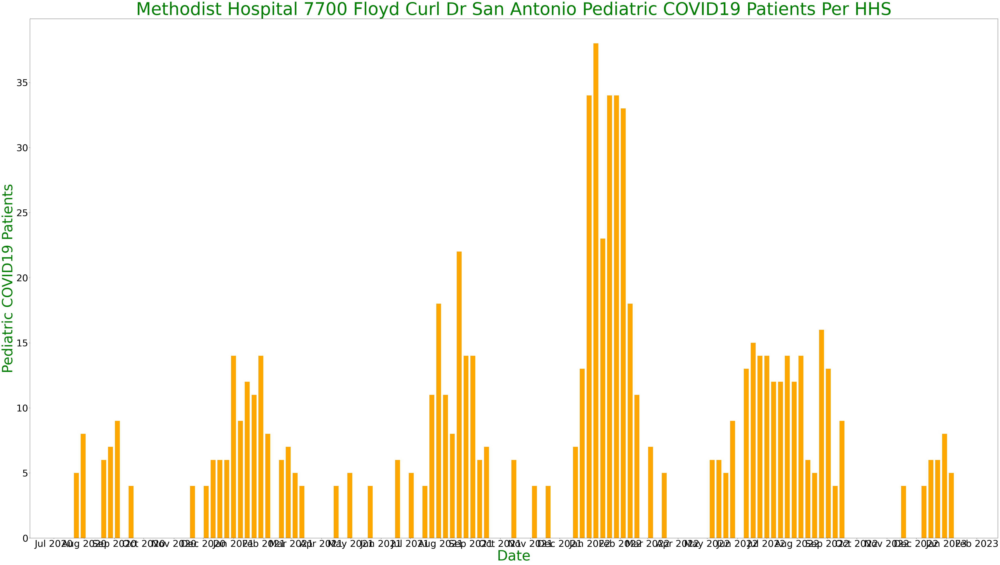

In [33]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Methodist Hospital 7700 Floyd Curl Dr San Antonio Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(ddd.index, ddd.previous_day_admission_pediatric_covid_confirmed_7_day_sum, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_Methodist_Pediatric.png')

In [34]:
aaa = df_covid_hospital[df_covid_hospital.hospital_pk == '453315'][['collection_week','hospital_name','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [35]:
bbb = aaa.sort_values(by = 'collection_week')

In [36]:
ccc = bbb.set_index('collection_week')

In [37]:
ddd = ccc[ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0][['previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

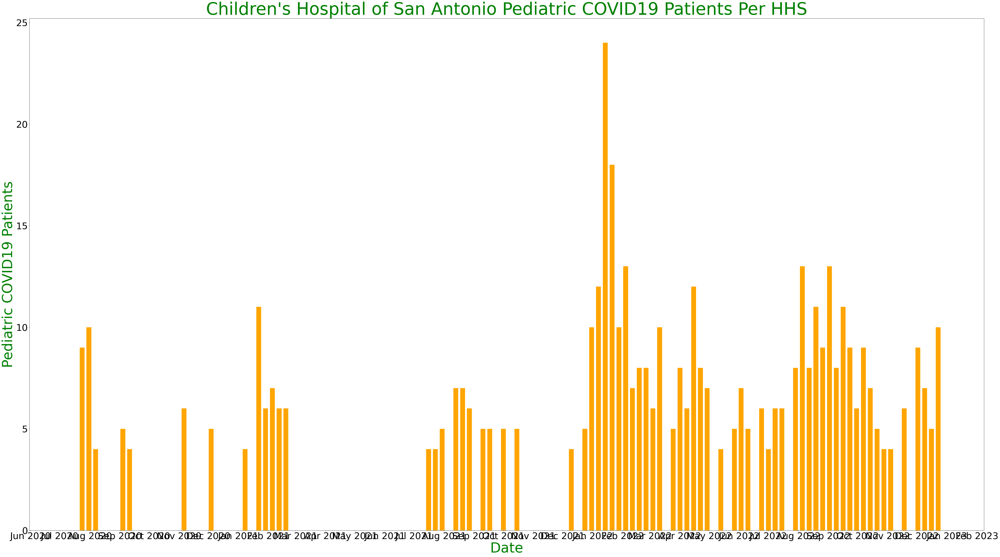

In [38]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Children\'s Hospital of San Antonio Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(ddd.index, ddd.previous_day_admission_pediatric_covid_confirmed_7_day_sum, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_Childrens_Pediatric.png')

In [39]:
aaa = df_covid_hospital[df_covid_hospital.hospital_pk == '450213'][['collection_week','hospital_name','address','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [40]:
aaa

,collection_week,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
5386,2020-05-22,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,NaN
8016,2020-04-10,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,NaN
20816,2021-02-05,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,7.0
22908,2022-11-04,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,0.0
23559,2021-01-08,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,4.0
24998,2021-12-03,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,7.0
28344,2021-10-08,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,-999999.0
43303,2020-05-29,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,NaN
45831,2020-09-18,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,0.0
48143,2021-02-26,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,5.0


In [41]:
bbb = aaa.sort_values(by = 'collection_week')
ccc = bbb.set_index('collection_week')
ddd = ccc[ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0][['previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

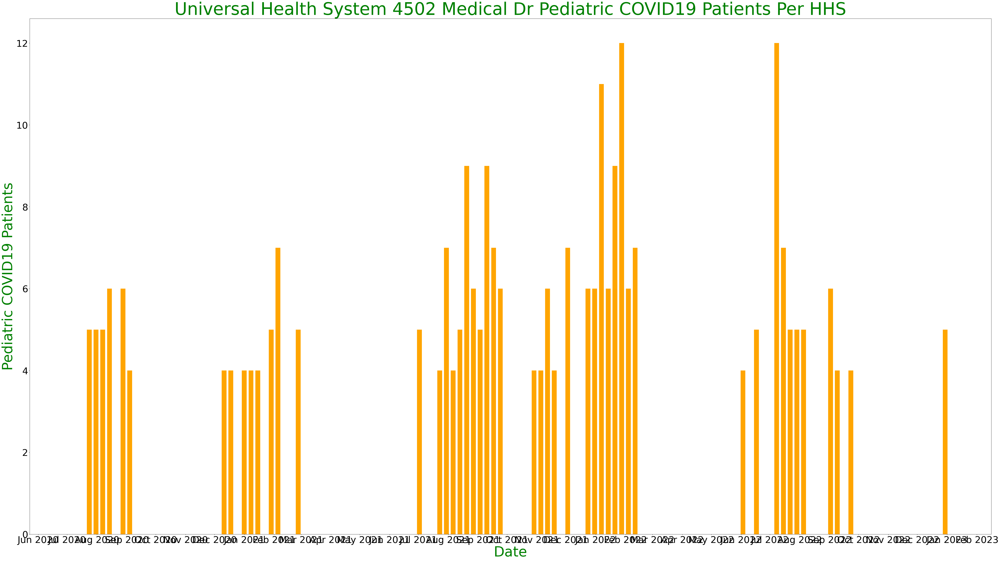

In [42]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Universal Health System 4502 Medical Dr Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(ddd.index, ddd.previous_day_admission_pediatric_covid_confirmed_7_day_sum, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_Universal_Pediatric.png')

In [43]:
aaa = df_covid_hospital[df_covid_hospital.hospital_pk == '450058'][['collection_week','hospital_name','address','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [44]:
aaa

,collection_week,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
19174,2020-05-01,BAPTIST MEDICAL CENTER,111 DALLAS STREET,NaN
19795,2022-11-11,BAPTIST MEDICAL CENTER,111 DALLAS STREET,0.0
22791,2021-10-15,BAPTIST MEDICAL CENTER,111 DALLAS STREET,-999999.0
25227,2021-09-10,BAPTIST MEDICAL CENTER,111 DALLAS STREET,10.0
28867,2021-04-16,BAPTIST MEDICAL CENTER,111 DALLAS STREET,0.0
39419,2022-04-08,BAPTIST MEDICAL CENTER,111 DALLAS STREET,0.0
42028,2022-08-05,BAPTIST MEDICAL CENTER,111 DALLAS STREET,0.0
47437,2020-10-16,BAPTIST MEDICAL CENTER,111 DALLAS STREET,0.0
61746,2021-01-08,BAPTIST MEDICAL CENTER,111 DALLAS STREET,0.0
94383,2020-09-04,BAPTIST MEDICAL CENTER,111 DALLAS STREET,0.0


In [45]:
bbb = aaa.sort_values(by = 'collection_week')
ccc = bbb.set_index('collection_week')
ddd = ccc[ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0][['previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [46]:
ddd

,previous_day_admission_pediatric_covid_confirmed_7_day_sum
collection_week,
2020-08-14,0.0
2020-08-21,0.0
2020-08-28,0.0
2020-09-04,0.0
2020-09-11,0.0
2020-09-18,0.0
2020-10-02,0.0
2020-10-09,0.0
2020-10-16,0.0


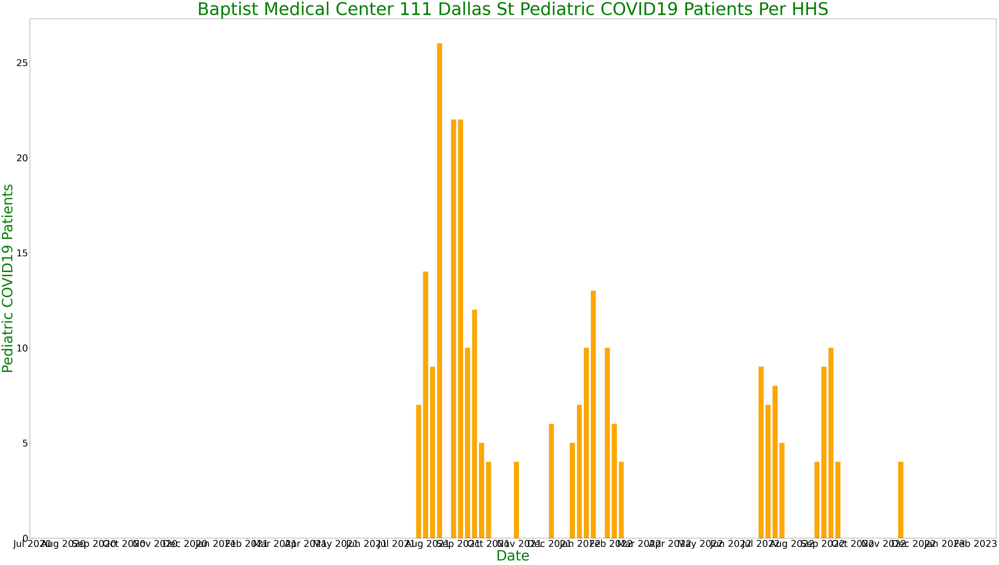

In [47]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Baptist Medical Center 111 Dallas St Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(ddd.index, ddd.previous_day_admission_pediatric_covid_confirmed_7_day_sum, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_Baptist_Pediatric.png')

In [48]:
aaa = df_covid_hospital[(df_covid_hospital.city == 'SAN ANTONIO') & (df_covid_hospital.collection_week == '2022-01-07')][['hospital_pk','hospital_name','address','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [49]:
bbb = aaa[aaa.previous_day_admission_pediatric_covid_confirmed_7_day_sum >=0]

In [50]:
aaa

,hospital_pk,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
57471,670055,METHODIST HOSPITAL STONE OAK,"1139 E SONTERRA BLVD,",0.0
110037,450697,TEXAS VISTA MEDICAL CENTER,7400 BARLITE BLVD,-999999.0
137285,670125,TEXAS CENTER FOR INFECTIOUS DISEASE,2303 SE MILITARY DR P O BOX 23340,0.0
175304,450237,CHRISTUS SANTA ROSA MEDICAL CENTER,2827 BABCOCK ROAD,0.0
263485,450780,METHODIST HOSPITAL AMBULATORY SURGERY,9150 HUEBNER RD SUITE 100,0.0
322541,450856,SOUTH TEXAS SPINE AND SURGICAL HOSPITAL,18600 NORTH HARDY OAK BLVD,0.0
429084,452016,KINDRED HOSPITAL SAN ANTONIO,3636 MEDICAL DRIVE,0.0
452991,670112,LEGENT ORTHOPEDIC + SPINE,5330 NORTH LOOP 1604 WEST,0.0
474617,670054,FOUNDATION SURGICAL HOSPITAL OF SAN ANTONIO,9522 HUEBNER ROAD,0.0
515757,450213,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,11.0


In [51]:
bbb

,hospital_pk,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
57471,670055,METHODIST HOSPITAL STONE OAK,"1139 E SONTERRA BLVD,",0.0
137285,670125,TEXAS CENTER FOR INFECTIOUS DISEASE,2303 SE MILITARY DR P O BOX 23340,0.0
175304,450237,CHRISTUS SANTA ROSA MEDICAL CENTER,2827 BABCOCK ROAD,0.0
263485,450780,METHODIST HOSPITAL AMBULATORY SURGERY,9150 HUEBNER RD SUITE 100,0.0
322541,450856,SOUTH TEXAS SPINE AND SURGICAL HOSPITAL,18600 NORTH HARDY OAK BLVD,0.0
429084,452016,KINDRED HOSPITAL SAN ANTONIO,3636 MEDICAL DRIVE,0.0
452991,670112,LEGENT ORTHOPEDIC + SPINE,5330 NORTH LOOP 1604 WEST,0.0
474617,670054,FOUNDATION SURGICAL HOSPITAL OF SAN ANTONIO,9522 HUEBNER ROAD,0.0
515757,450213,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,11.0
537179,452059,PAM SPECIALTY HOSPITAL OF SAN ANTONIO MEDICAL CEN,8902 FLOYD CURL DR.,0.0


In [52]:
aaa = df_covid_hospital[df_covid_hospital.city == 'SAN ANTONIO']

In [53]:
aaa

In [54]:
date_list = aaa.collection_week.unique()

In [55]:
date_list.sort()

In [96]:
date_list

array(['2020-03-13T00:00:00.000000000', '2020-03-20T00:00:00.000000000',
       '2020-03-27T00:00:00.000000000', '2020-04-03T00:00:00.000000000',
       '2020-04-10T00:00:00.000000000', '2020-04-17T00:00:00.000000000',
       '2020-04-24T00:00:00.000000000', '2020-05-01T00:00:00.000000000',
       '2020-05-08T00:00:00.000000000', '2020-05-15T00:00:00.000000000',
       '2020-05-22T00:00:00.000000000', '2020-05-29T00:00:00.000000000',
       '2020-06-05T00:00:00.000000000', '2020-06-12T00:00:00.000000000',
       '2020-06-19T00:00:00.000000000', '2020-06-26T00:00:00.000000000',
       '2020-07-03T00:00:00.000000000', '2020-07-10T00:00:00.000000000',
       '2020-07-17T00:00:00.000000000', '2020-07-24T00:00:00.000000000',
       '2020-07-31T00:00:00.000000000', '2020-08-07T00:00:00.000000000',
       '2020-08-14T00:00:00.000000000', '2020-08-21T00:00:00.000000000',
       '2020-08-28T00:00:00.000000000', '2020-09-04T00:00:00.000000000',
       '2020-09-11T00:00:00.000000000', '2020-09-18

In [97]:
sa_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    sa_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))

In [98]:
df_sa_ped = pd.DataFrame(sa_ped_list, columns = ['date', 'ped_count'])

In [99]:
df_sa_ped.tail()

,date,ped_count
143,2022-12-09,80.0
144,2022-12-16,88.0
145,2022-12-23,100.0
146,2022-12-30,123.0
147,2023-01-06,14.0


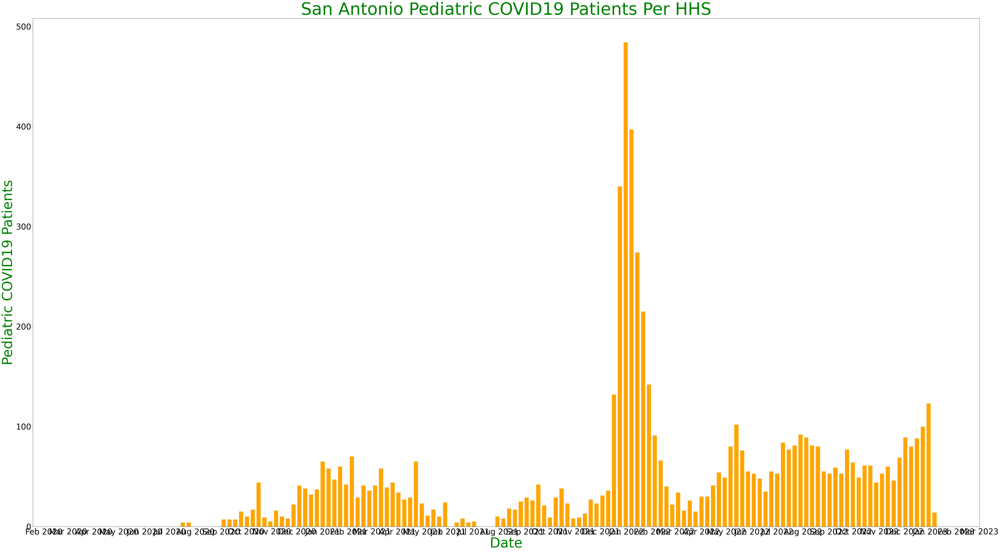

In [100]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=35)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('San Antonio Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_sa_ped.date, df_sa_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_San_Antonio_Pediatric.png')

In [101]:
aaa = df_covid_hospital[df_covid_hospital.state == 'NY']

In [102]:
date_list = aaa.collection_week.unique()
date_list.sort()
ny_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ny_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ny_ped = pd.DataFrame(ny_ped_list, columns = ['date', 'ped_count'])

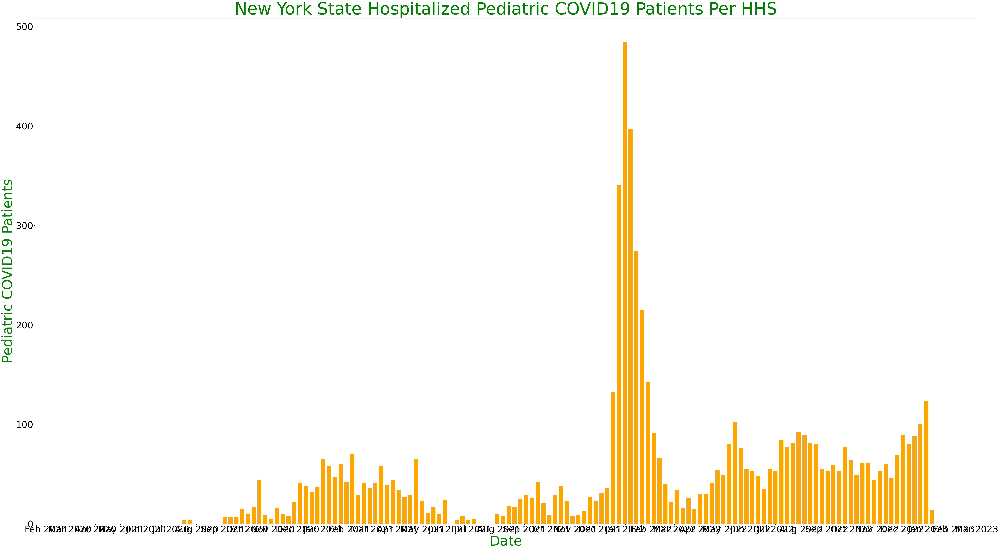

In [103]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('New York State Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ny_ped.date, df_ny_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_NY_Pediatric.png')

In [104]:
aaa = df_covid_hospital[df_covid_hospital.state == 'TX']
date_list = aaa.collection_week.unique()
date_list.sort()
tx_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    tx_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_tx_ped = pd.DataFrame(tx_ped_list, columns = ['date', 'ped_count'])

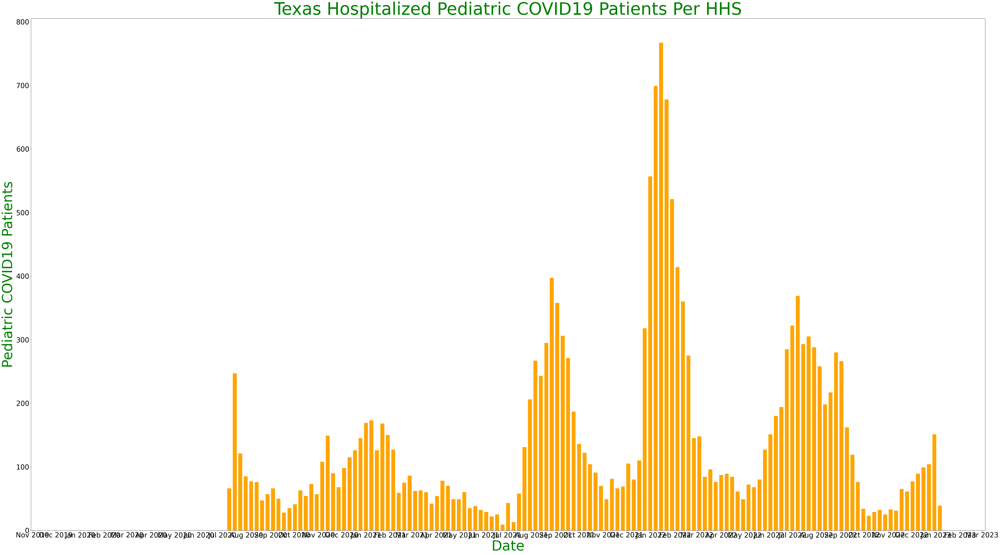

In [105]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Texas Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_tx_ped.date, df_tx_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_TX_Pediatric.png')

In [106]:
aaa = df_covid_hospital[df_covid_hospital.state == 'TX']
date_list = aaa.collection_week.unique()
date_list.sort()
tx_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    tx_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_tx_ped = pd.DataFrame(tx_ped_list, columns = ['date', 'ped_count'])

In [107]:
aaa = df_covid_hospital[df_covid_hospital.state == 'CA']
date_list = aaa.collection_week.unique()
date_list.sort()
ca_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ca_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ca_ped = pd.DataFrame(ca_ped_list, columns = ['date', 'ped_count'])

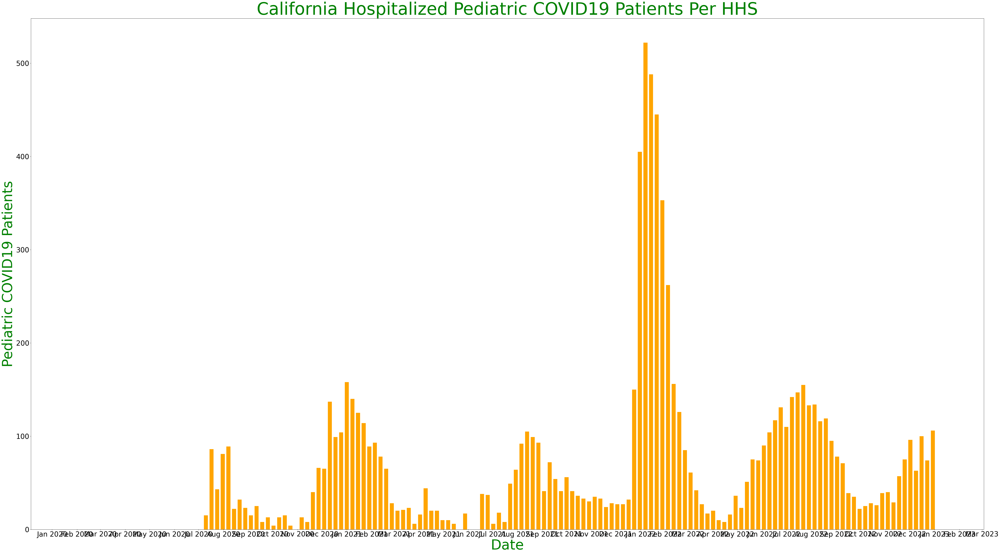

In [108]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('California Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ca_ped.date, df_ca_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_CA_Pediatric.png')

In [109]:
aaa = df_covid_hospital
date_list = aaa.collection_week.unique()
date_list.sort()
us_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    us_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_us_ped = pd.DataFrame(us_ped_list, columns = ['date', 'ped_count'])

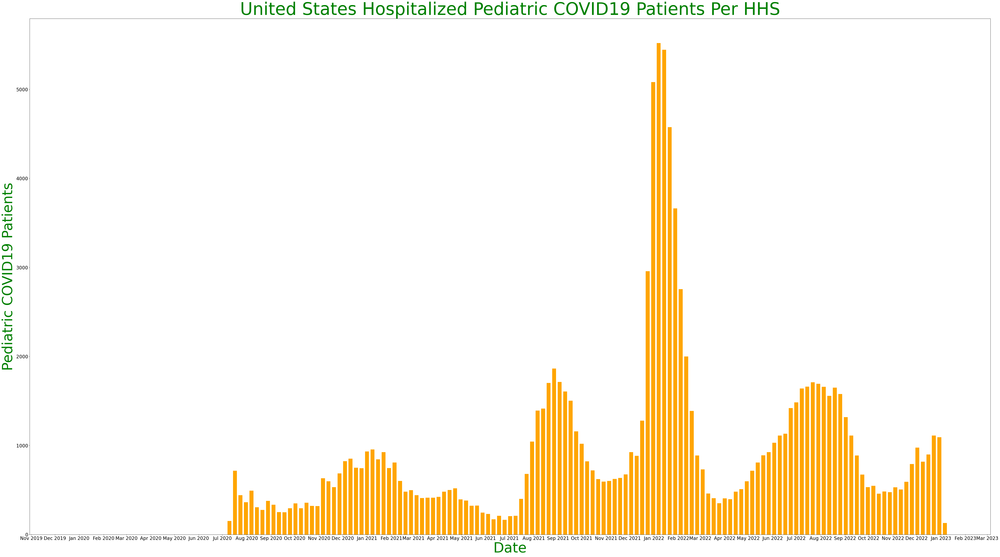

In [110]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=20)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('United States Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_us_ped.date, df_us_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_US_Pediatric.png')

In [111]:
aaa = df_covid_hospital
date_list = aaa.collection_week.unique()
date_list.sort()
us_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.all_pediatric_inpatient_bed_occupied_7_day_sum  >= 0]
    #print()
    us_ped_list.append((x, ccc.all_pediatric_inpatient_bed_occupied_7_day_sum .sum()))
df_us_ped = pd.DataFrame(us_ped_list, columns = ['date', 'ped_count'])

In [136]:
aaa = df_covid_hospital
date_list = aaa.collection_week.unique()
date_list.sort()
us_adult_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_adult_covid_confirmed_7_day_sum >= 0]
    #print()
    us_adult_list.append((x, ccc.previous_day_admission_adult_covid_confirmed_7_day_sum.sum()))
df_us_adult = pd.DataFrame(us_adult_list, columns = ['date', 'adult_count'])

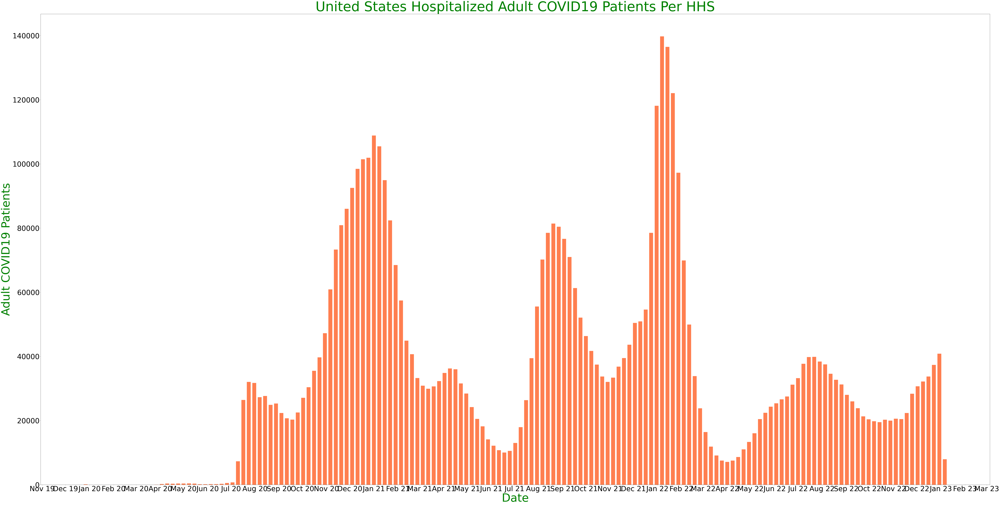

In [149]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %y')
fig, ax = plt.subplots()
fig.set_size_inches(120,60)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=50)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('United States Hospitalized Adult COVID19 Patients Per HHS', color = 'green', fontsize = 95)
plt.xlabel('Date',color='green', fontsize = 80)
plt.ylabel('Adult COVID19 Patients',color='green', fontsize = 80)
plt.bar(df_us_adult.date, df_us_adult.adult_count, color = 'coral', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_US_Adult.png')

staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum 

In [114]:
aaa = df_covid_hospital
date_list = aaa.collection_week.unique()
date_list.sort()
us_adult_icu_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum >= 0]
    #print()
    us_adult_icu_list.append((x, ccc.staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum.sum()))
df_us_adult_icu = pd.DataFrame(us_adult_icu_list, columns = ['date', 'adult_icu_count'])

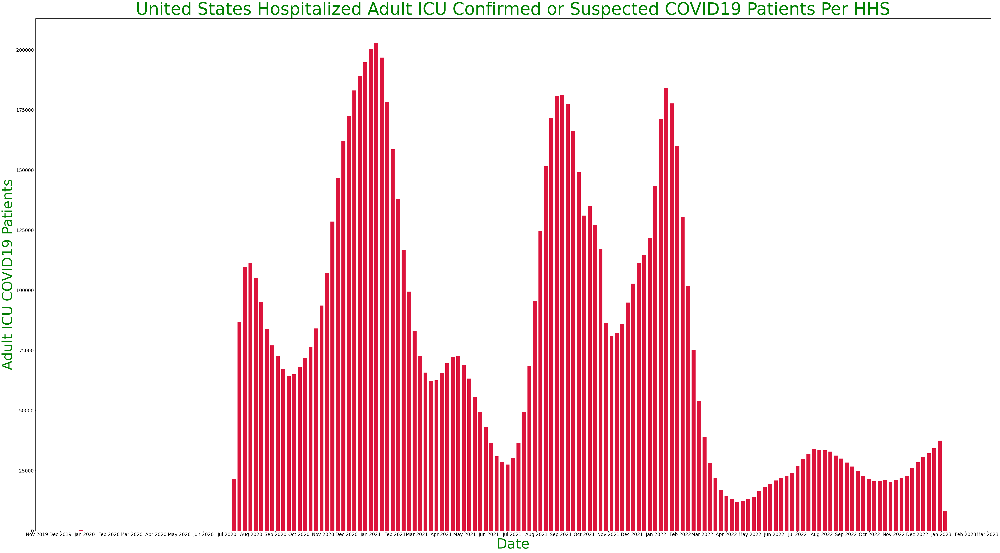

In [115]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=20)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('United States Hospitalized Adult ICU Confirmed or Suspected COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Adult ICU COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_us_adult_icu.date, df_us_adult_icu.adult_icu_count, color = 'crimson', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_US_Adult_ICU.png')

In [116]:
aaa = df_covid_hospital[df_covid_hospital.state == 'AL']
date_list = aaa.collection_week.unique()
date_list.sort()
al_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    al_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_al_ped = pd.DataFrame(al_ped_list, columns = ['date', 'ped_count'])

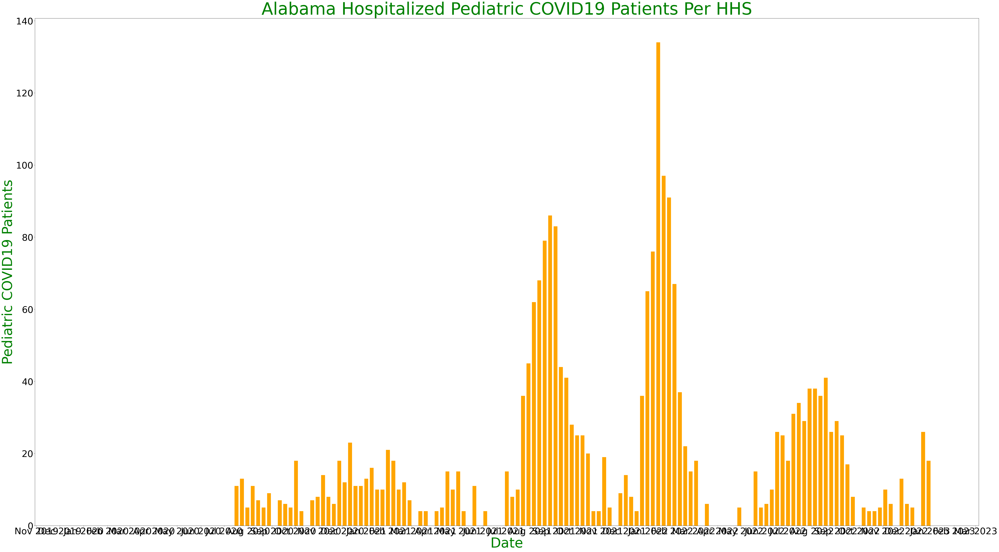

In [117]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Alabama Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_al_ped.date, df_al_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_AL_Pediatric.png')

In [118]:
aaa = df_covid_hospital[df_covid_hospital.state == 'IL']
date_list = aaa.collection_week.unique()
date_list.sort()
il_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    il_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_il_ped = pd.DataFrame(il_ped_list, columns = ['date', 'ped_count'])

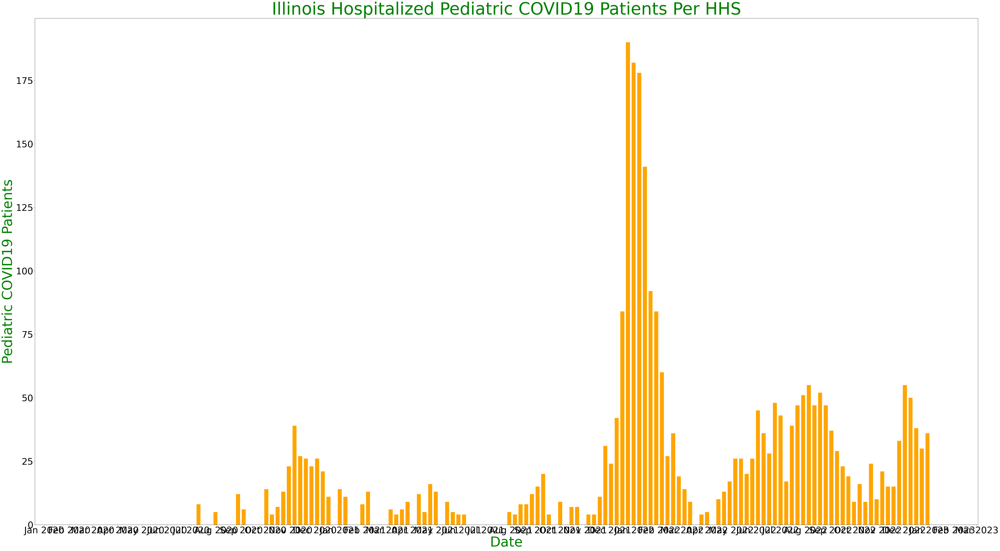

In [119]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Illinois Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_il_ped.date, df_il_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_IL_Pediatric.png')

In [120]:
aaa = df_covid_hospital[df_covid_hospital.state == 'AK']
date_list = aaa.collection_week.unique()
date_list.sort()
ak_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ak_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ak_ped = pd.DataFrame(ak_ped_list, columns = ['date', 'ped_count'])

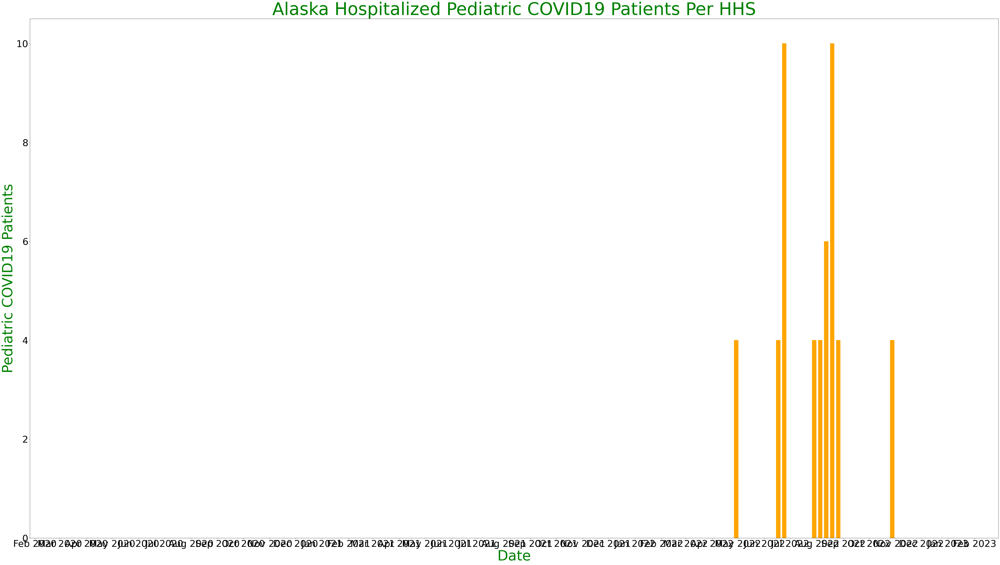

In [121]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Alaska Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ak_ped.date, df_ak_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_AK_Pediatric.png')

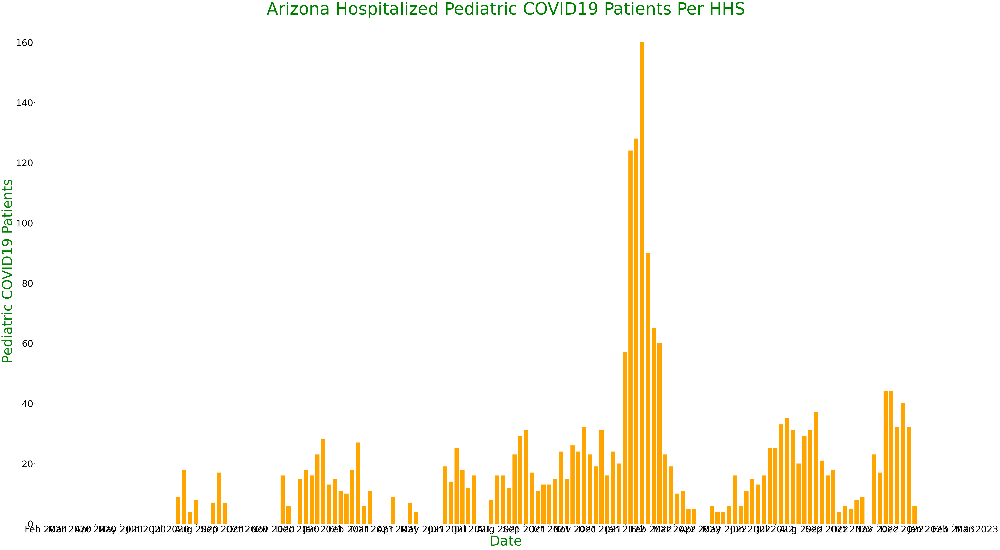

In [122]:
aaa = df_covid_hospital[df_covid_hospital.state == 'AZ']
date_list = aaa.collection_week.unique()
date_list.sort()
az_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    az_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_az_ped = pd.DataFrame(az_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Arizona Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_az_ped.date, df_az_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_AZ_Pediatric.png')

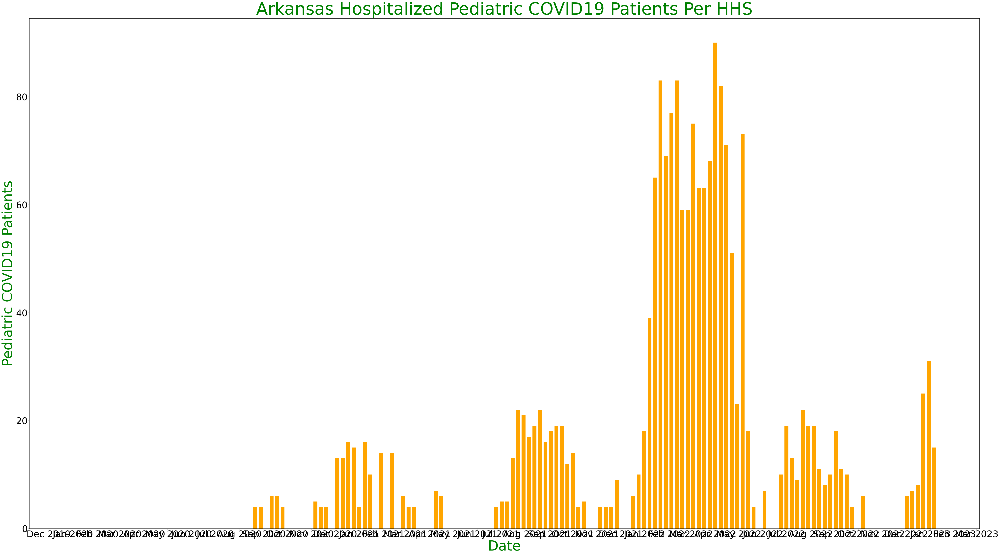

In [123]:
aaa = df_covid_hospital[df_covid_hospital.state == 'AR']
date_list = aaa.collection_week.unique()
date_list.sort()
ar_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ar_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ar_ped = pd.DataFrame(ar_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Arkansas Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ar_ped.date, df_ar_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_AR_Pediatric.png')

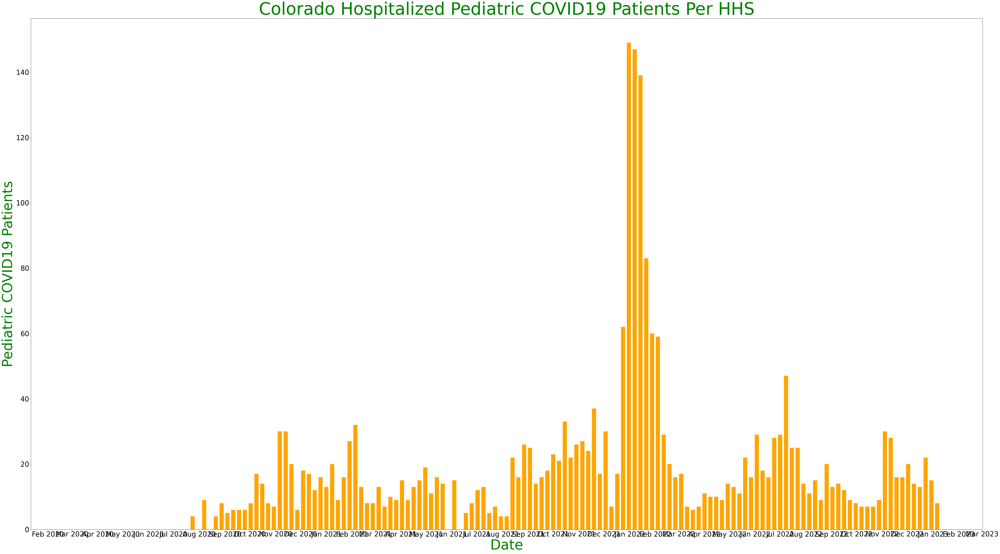

In [124]:
aaa = df_covid_hospital[df_covid_hospital.state == 'CO']
date_list = aaa.collection_week.unique()
date_list.sort()
co_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    co_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_co_ped = pd.DataFrame(co_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Colorado Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_co_ped.date, df_co_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_CO_Pediatric.png')

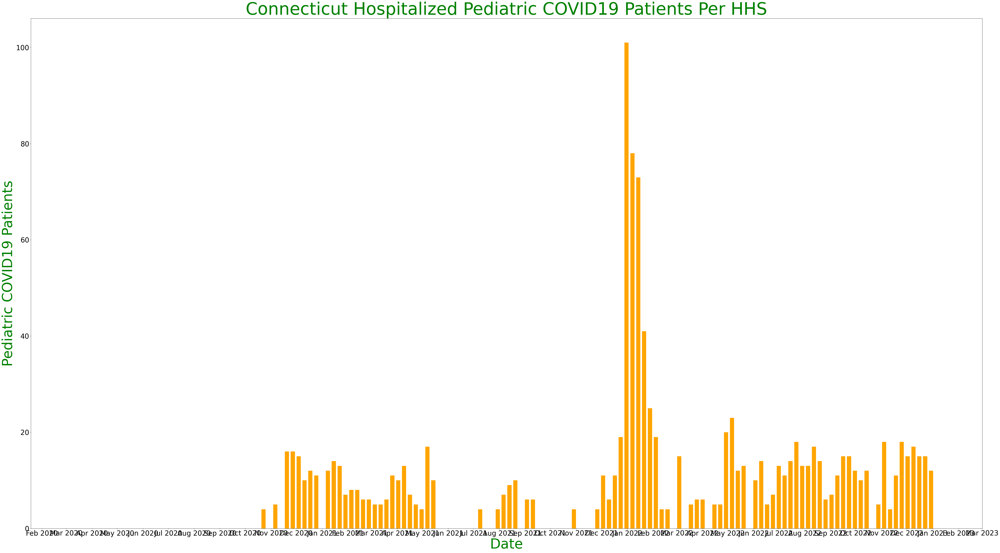

In [125]:
aaa = df_covid_hospital[df_covid_hospital.state == 'CT']
date_list = aaa.collection_week.unique()
date_list.sort()
ct_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ct_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ct_ped = pd.DataFrame(ct_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Connecticut Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ct_ped.date, df_ct_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_CT_Pediatric.png')

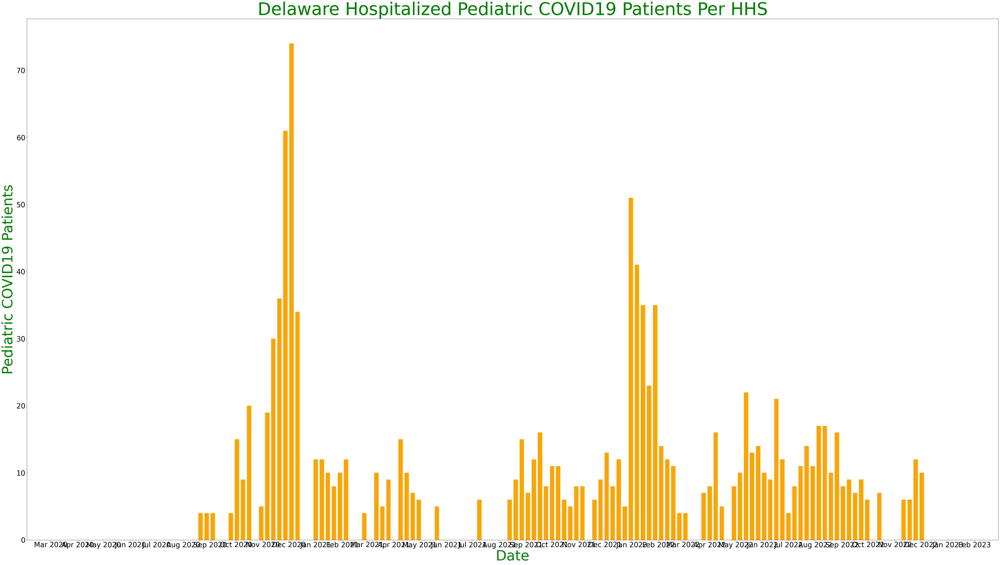

In [126]:
aaa = df_covid_hospital[df_covid_hospital.state == 'DE']
date_list = aaa.collection_week.unique()
date_list.sort()
de_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    de_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_de_ped = pd.DataFrame(de_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Delaware Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_de_ped.date, df_de_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_DE_Pediatric.png')

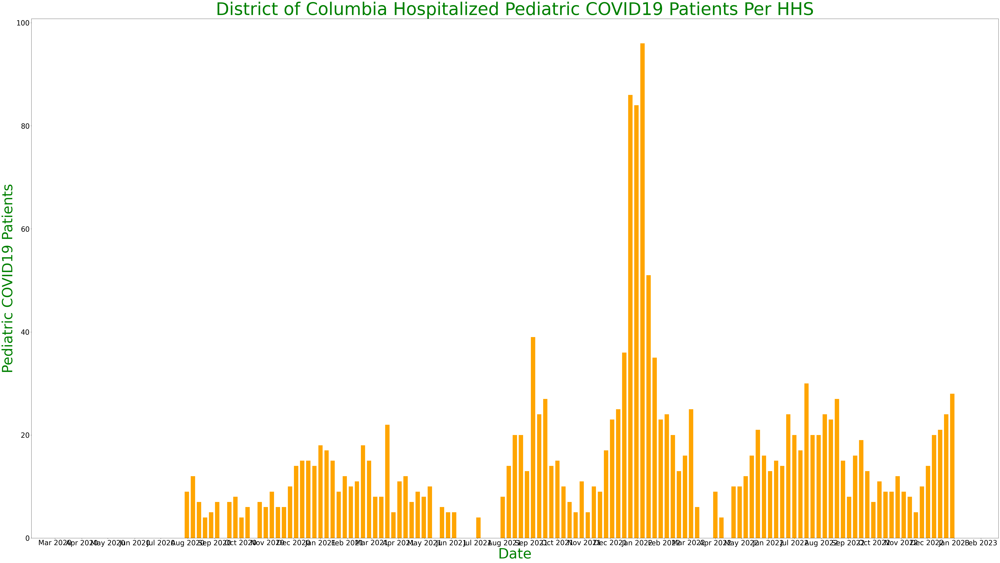

In [127]:
aaa = df_covid_hospital[df_covid_hospital.state == 'DC']
date_list = aaa.collection_week.unique()
date_list.sort()
dc_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    dc_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_dc_ped = pd.DataFrame(dc_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('District of Columbia Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_dc_ped.date, df_dc_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_DC_Pediatric.png')

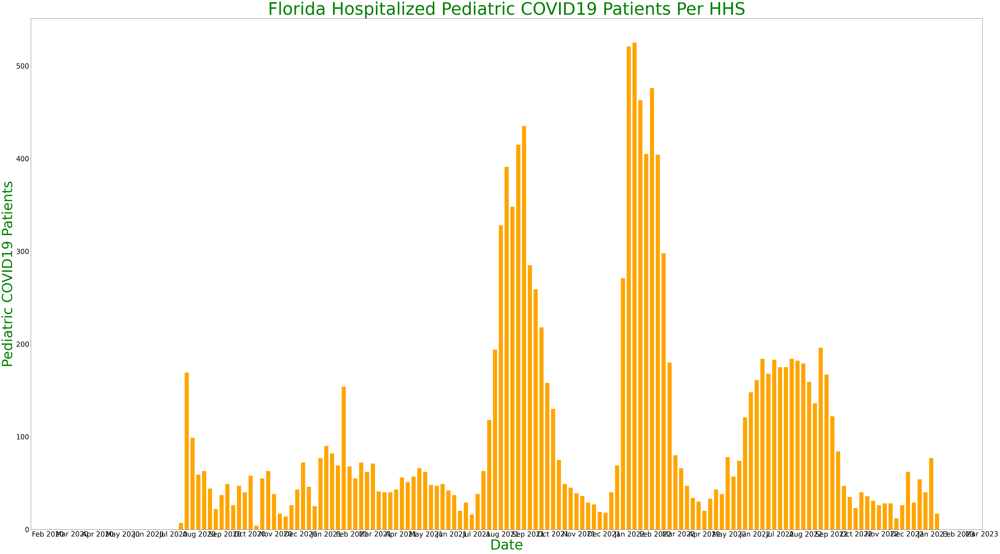

In [128]:
aaa = df_covid_hospital[df_covid_hospital.state == 'FL']
date_list = aaa.collection_week.unique()
date_list.sort()
fl_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    fl_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_fl_ped = pd.DataFrame(fl_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Florida Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_fl_ped.date, df_fl_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_FL_Pediatric.png')

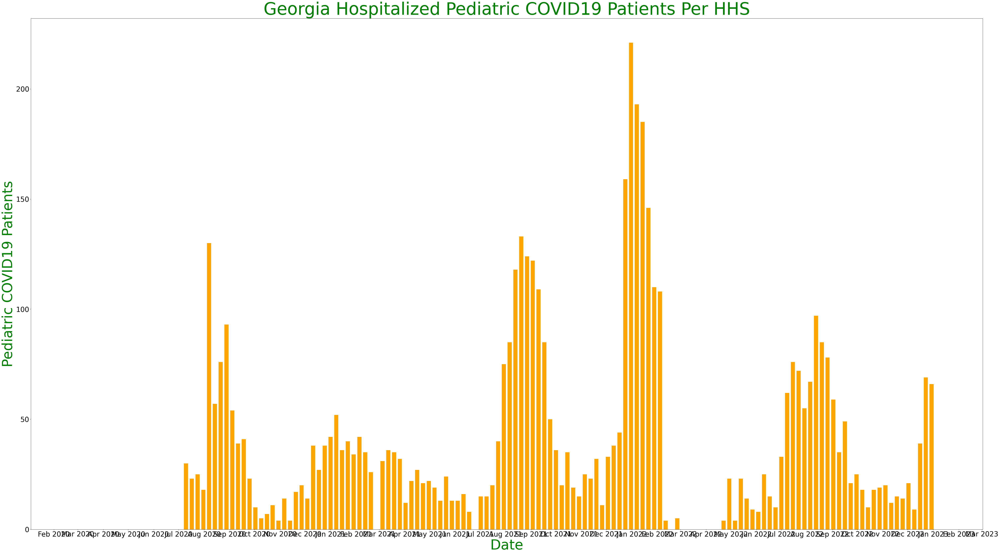

In [129]:
aaa = df_covid_hospital[df_covid_hospital.state == 'GA']
date_list = aaa.collection_week.unique()
date_list.sort()
ga_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ga_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ga_ped = pd.DataFrame(ga_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Georgia Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ga_ped.date, df_ga_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_GA_Pediatric.png')

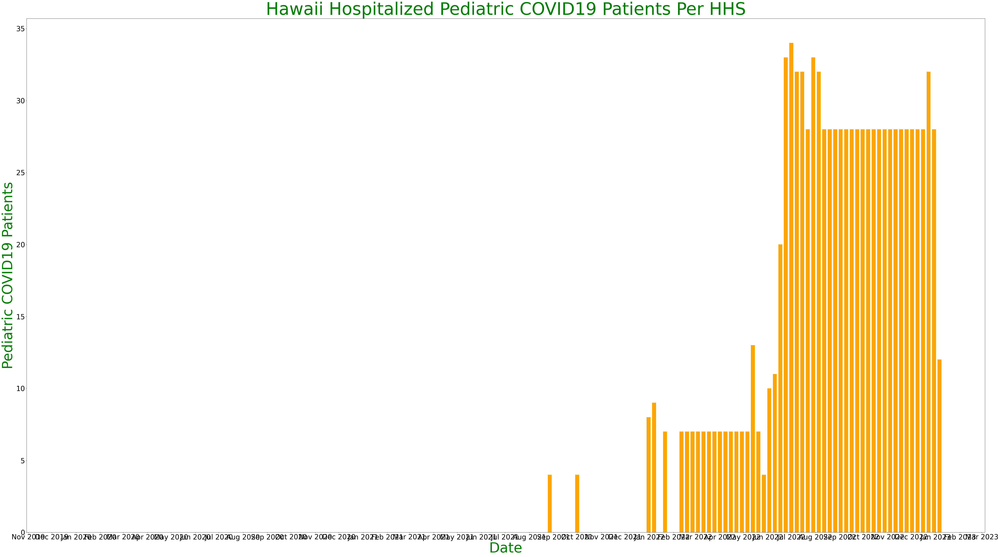

In [130]:
aaa = df_covid_hospital[df_covid_hospital.state == 'HI']
date_list = aaa.collection_week.unique()
date_list.sort()
hi_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    hi_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_hi_ped = pd.DataFrame(hi_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Hawaii Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_hi_ped.date, df_hi_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_HI_Pediatric.png')

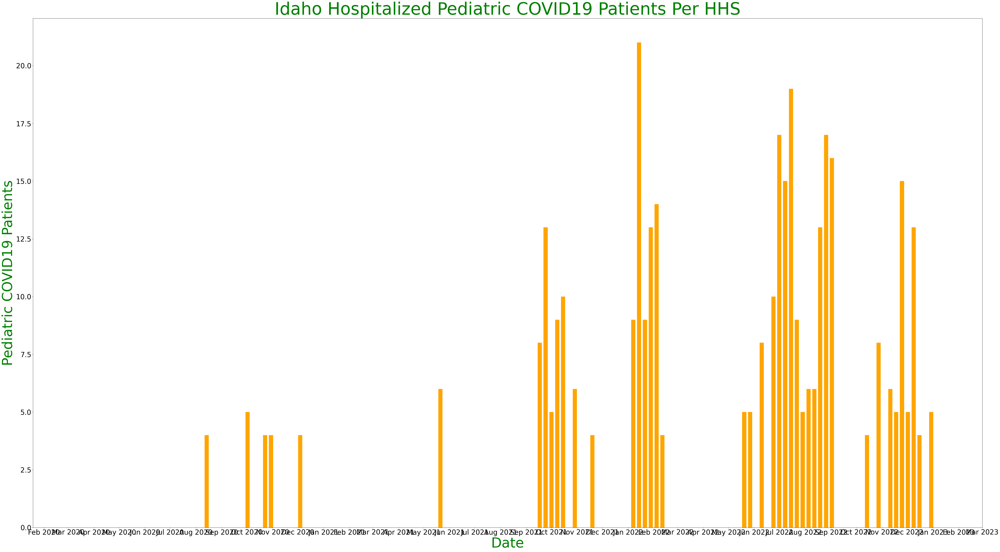

In [131]:
aaa = df_covid_hospital[df_covid_hospital.state == 'ID']
date_list = aaa.collection_week.unique()
date_list.sort()
id_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    id_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_id_ped = pd.DataFrame(id_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Idaho Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_id_ped.date, df_id_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_ID_Pediatric.png')

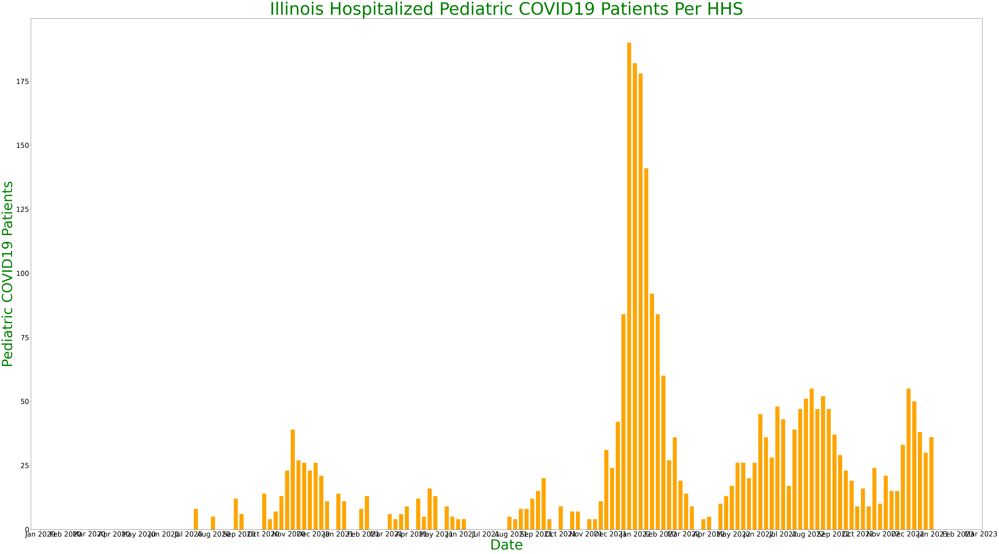

In [132]:
aaa = df_covid_hospital[df_covid_hospital.state == 'IL']
date_list = aaa.collection_week.unique()
date_list.sort()
il_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    il_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_il_ped = pd.DataFrame(il_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Illinois Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_il_ped.date, df_il_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_IL_Pediatric.png')

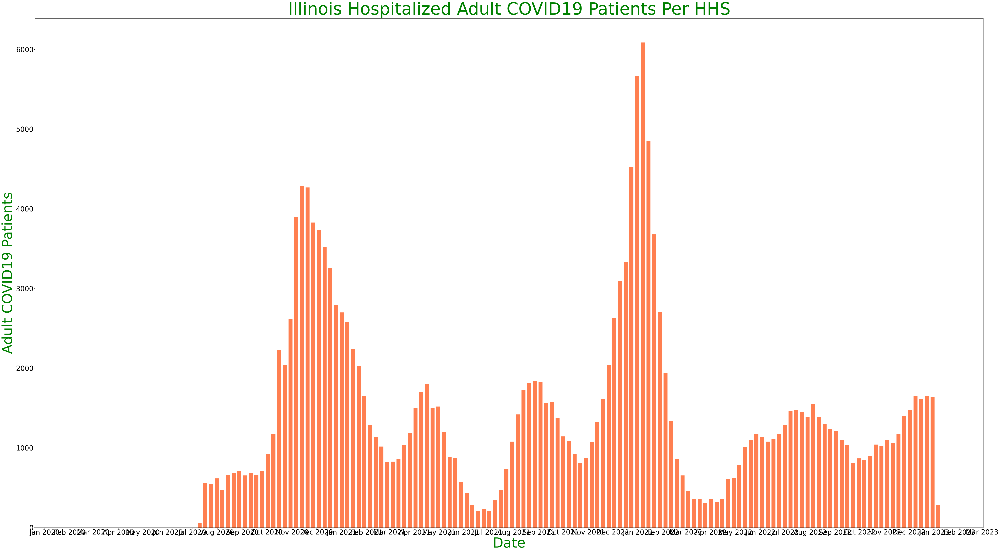

In [133]:
aaa = df_covid_hospital[df_covid_hospital.state == 'IL']
date_list = aaa.collection_week.unique()
date_list.sort()
il_adult_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_adult_covid_confirmed_7_day_sum >= 0]
    #print()
    il_adult_list.append((x, ccc.previous_day_admission_adult_covid_confirmed_7_day_sum.sum()))
df_il_adult = pd.DataFrame(il_adult_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Illinois Hospitalized Adult COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Adult COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_il_adult.date, df_il_adult.ped_count, color = 'coral', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_IL_Adult.png')

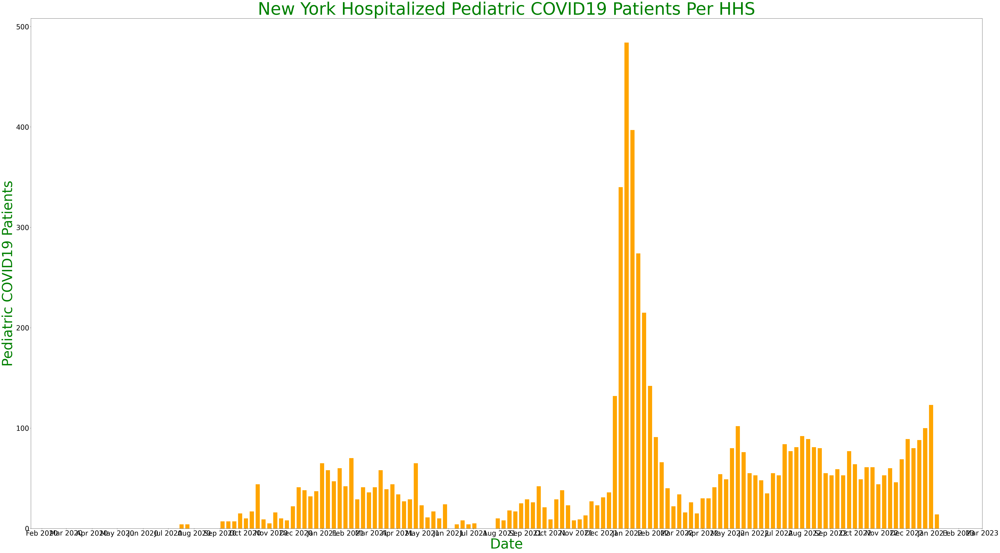

In [134]:
aaa = df_covid_hospital[df_covid_hospital.state == 'NY']
date_list = aaa.collection_week.unique()
date_list.sort()
ny_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ny_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ny_ped = pd.DataFrame(ny_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('New York Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ny_ped.date, df_ny_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_NY_Pediatric.png')


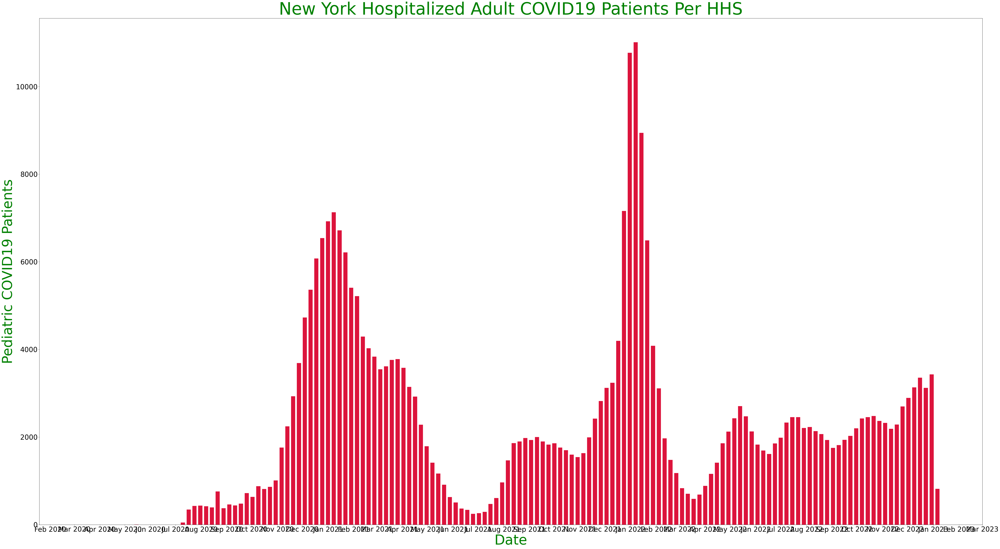

In [135]:
aaa = df_covid_hospital[df_covid_hospital.state == 'NY']
date_list = aaa.collection_week.unique()
date_list.sort()
ny_adult_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_adult_covid_confirmed_7_day_sum >= 0]
    #print()
    ny_adult_list.append((x, ccc.previous_day_admission_adult_covid_confirmed_7_day_sum.sum()))
df_ny_adult = pd.DataFrame(ny_adult_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('New York Hospitalized Adult COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ny_adult.date, df_ny_adult.ped_count, color = 'crimson', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_NY_Adult.png')
